In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib as mp
import matplotlib.pyplot as plt

import nltk
import re
import string
from nltk.corpus import stopwords
from nltk import word_tokenize
nltk.download('punkt')

from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import  TfidfTransformer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.ensemble import ExtraTreesClassifier, RandomForestClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import plot_confusion_matrix,classification_report,confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.pipeline import Pipeline,make_pipeline
import lime
from lime import lime_text
from lime.lime_text import LimeTextExplainer
import spacy
import tensorflow as tf
import gensim
from gensim.models import Word2Vec
from wordcloud import WordCloud
from nltk.probability import FreqDist
from sklearn.decomposition import LatentDirichletAllocation
import gensim.corpora as corpora
from pprint import pprint
# Plotting tools
import pyLDAvis
import pyLDAvis.gensim
import random
from sklearn.decomposition import NMF

import warnings
warnings.filterwarnings('ignore')

[nltk_data] Downloading package punkt to /usr/share/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


2021-11-29 22:38:38.242446: W tensorflow/stream_executor/platform/default/dso_loader.cc:60] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /opt/conda/lib
2021-11-29 22:38:38.242609: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


# Text data

# Working with NLTK

In [2]:
df = pd.read_csv("/kaggle/input/nlp-getting-started/train.csv")
df.head()

,id,keyword,location,text,target
0,1,NaN,NaN,Our Deeds are the Reason of this #earthquake M...,1
1,4,NaN,NaN,Forest fire near La Ronge Sask. Canada,1
2,5,NaN,NaN,All residents asked to 'shelter in place' are ...,1
3,6,NaN,NaN,"13,000 people receive #wildfires evacuation or...",1
4,7,NaN,NaN,Just got sent this photo from Ruby #Alaska as ...,1


In [3]:
df.shape # 7613 observations and four features and one target

(7613, 5)

<AxesSubplot:xlabel='target', ylabel='count'>

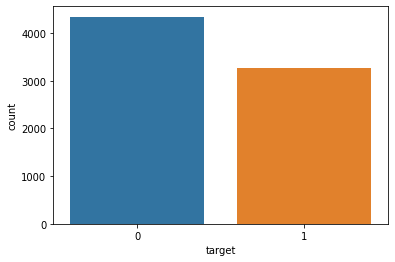

In [4]:
sns.countplot(data=df,x='target')

In [5]:
df['target'].value_counts()

0    4342
1    3271
Name: target, dtype: int64

In [6]:
df['target'] = df.target.astype(str)
df.dtypes 

id           int64
keyword     object
location    object
text        object
target      object
dtype: object

### Features and Labels

In [7]:
data = df[['text','target']]
data.head()

,text,target
0,Our Deeds are the Reason of this #earthquake M...,1
1,Forest fire near La Ronge Sask. Canada,1
2,All residents asked to 'shelter in place' are ...,1
3,"13,000 people receive #wildfires evacuation or...",1
4,Just got sent this photo from Ruby #Alaska as ...,1


In [8]:
# any null columns
data.isnull().sum()

text      0
target    0
dtype: int64

In [9]:
# remove all characters not number or characters
def cleanText(input_string):
    modified_string = re.sub('[^A-Za-z0-9]+', ' ', input_string)
    modified_string = re.sub('[0-9]+', ' ', modified_string)
    modified_string=re.sub("[@]","",modified_string)
    return(modified_string)
data['text'] = data.text.apply(cleanText)
data['text'][150]



' mickinyman TheAtlantic That or they might be killed in an airplane accident in the night a car wreck Politics at it s best '

In [10]:
# Remove non printable characters
def remove_not_ASCII(text):
    text = ''.join([word for word in text if word in string.printable])
    return text
data['text'] = data.text.apply(remove_not_ASCII)
data['text'][150]


' mickinyman TheAtlantic That or they might be killed in an airplane accident in the night a car wreck Politics at it s best '

In [11]:
data.sample(10)

,text,target
1077,The crew on EnolaGay had nuclear bomb on board...,1
473,Strongly condemn attack on ARY news team in Ka...,1
7584,These boxes are ready to explode Exploding Kit...,0
2971,don t you dare play the victim when I ve been ...,0
638,The Threat Anthrax CDC http t co q oxzq VE via...,1
1086,Soul food sound so bomb right now,0
6702,thunder outside my house this afternoon gawx,1
5751,Live Workshop selfie at booth or riot Kappa,1
1790,am boy Crash https t co f Ylp pfN,0
6206,In I will only smoke crqck if I becyme a may...,0


In [12]:
#converting to lower case
data['text']=data['text'].str.lower()

In [13]:
#removing punctuations
data['text']=data['text'].str.translate(str.maketrans('','',string.punctuation))

In [14]:
 nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /usr/share/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [15]:
stopWords=stopwords.words('english')+['the', 'a', 'k','h','g','an', 'i', 'he', 'she', 'they', 'to', 'of', 'it', 'n','from','u','w','p','x','c','r','co','http','https','b','e','v','l','q']
def removeStopWords(stopWords, rvw_txt):
    newtxt = ' '.join([word for word in rvw_txt.split() if word not in stopWords])
    return newtxt
data['text'] = [removeStopWords(stopWords,x) for x in data['text']]

In [16]:
#splitting text into words
tokenList=[]
for indx in range(len(data)):
       token=word_tokenize(data['text'][indx])
       tokenList.append(token)
data['text_tokens'] = tokenList
data.head()

,text,target,text_tokens
0,deeds reason earthquake may allah forgive us,1,"[deeds, reason, earthquake, may, allah, forgiv..."
1,forest fire near la ronge sask canada,1,"[forest, fire, near, la, ronge, sask, canada]"
2,residents asked shelter place notified officer...,1,"[residents, asked, shelter, place, notified, o..."
3,people receive wildfires evacuation orders cal...,1,"[people, receive, wildfires, evacuation, order..."
4,got sent photo ruby alaska smoke wildfires pou...,1,"[got, sent, photo, ruby, alaska, smoke, wildfi..."


## Frequency distributions

In [17]:
textcorpus=' ' .join([str(item) for item in data['text_tokens'] ])

In [18]:
#textcorpus

In [19]:
word_tokens = word_tokenize(textcorpus)

#print(word_tokens)

In [20]:
#removing punctuations
filtered_words = []

for w in word_tokens:
    if w not in string.punctuation:
        filtered_words.append(w)
        
#print(filtered_words)

In [21]:
freq_dist = FreqDist(filtered_words)

print(freq_dist)

<FreqDist with 21961 samples and 76802 outcomes>


In [22]:
freq_dist.most_common(20)

[("'like", 348),
 ("'amp", 344),
 ("'fire", 254),
 ("'get", 229),
 ("'new", 228),
 ("'via", 220),
 ("'news", 213),
 ("'people", 200),
 ("'one", 199),
 ("'video", 166),
 ("'disaster", 158),
 ("'emergency", 158),
 ("'police", 143),
 ("'would", 137),
 ("'us", 133),
 ("'time", 132),
 ("'body", 131),
 ("'still", 129),
 ("'got", 126),
 ("'california", 121)]

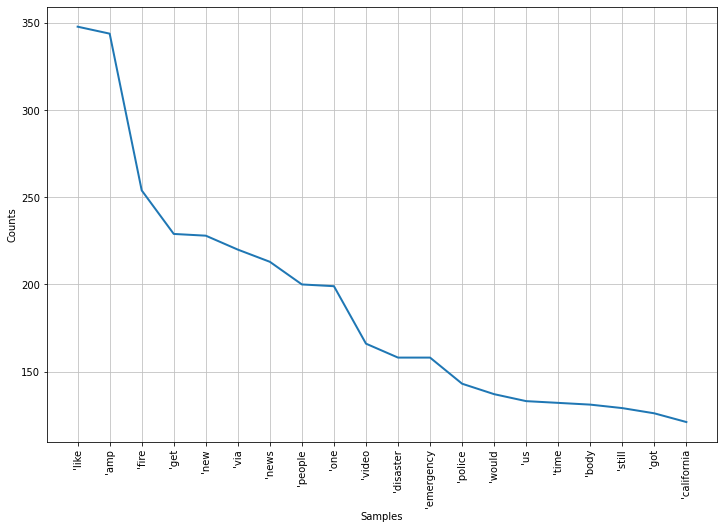

In [23]:
fig, ax = plt.subplots(figsize=(12, 8))

freq_dist.plot(20, cumulative=False)

plt.show()

#### We can view the most frequent terms in the word cloud

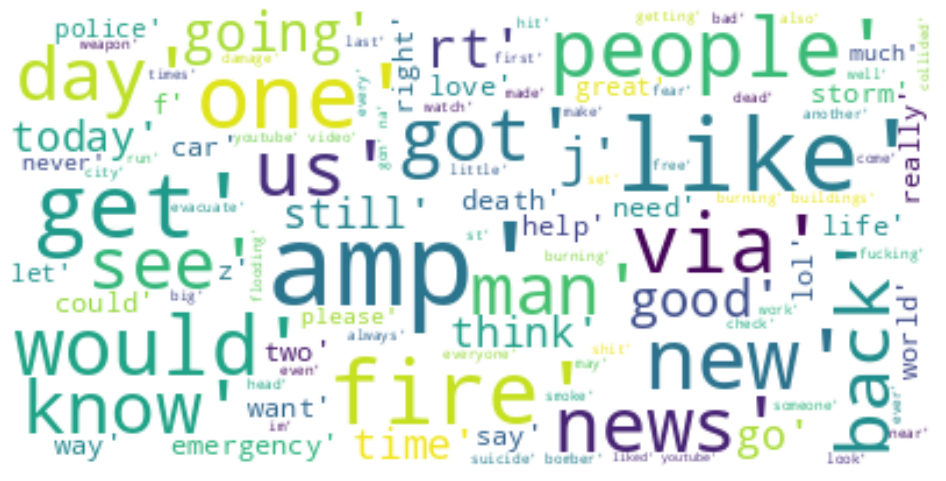

In [24]:
wordcloud = WordCloud(max_font_size=50, max_words=100, background_color="white").generate(textcorpus)
plt.figure(figsize=(15, 10), dpi=80)
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

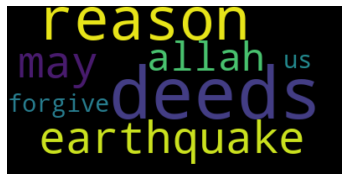

In [25]:
text = data.text[0]

# Create and generate a word cloud image:
wordcloud = WordCloud().generate(text)

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

In [26]:
print(data.target[0]) ## disaster tweet

1


### When target equals 1 

In [27]:
df_1 = data[data.target == '1']

In [28]:
df_1.head()

,text,target,text_tokens
0,deeds reason earthquake may allah forgive us,1,"[deeds, reason, earthquake, may, allah, forgiv..."
1,forest fire near la ronge sask canada,1,"[forest, fire, near, la, ronge, sask, canada]"
2,residents asked shelter place notified officer...,1,"[residents, asked, shelter, place, notified, o..."
3,people receive wildfires evacuation orders cal...,1,"[people, receive, wildfires, evacuation, order..."
4,got sent photo ruby alaska smoke wildfires pou...,1,"[got, sent, photo, ruby, alaska, smoke, wildfi..."


In [29]:
text = " ".join(x for x in df_1.text)


In [30]:
len(text)

249219

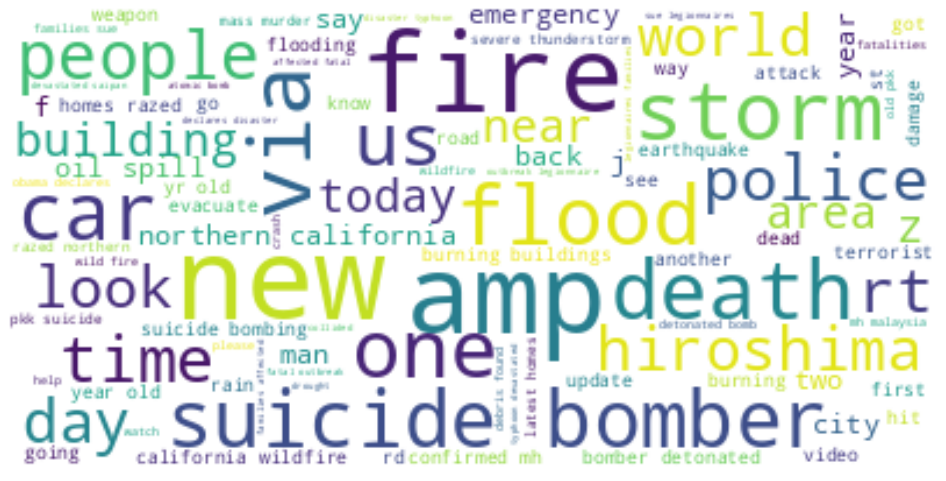

In [31]:
wordcloud = WordCloud(max_font_size=50, max_words=100, background_color="white").generate(text)
plt.figure(figsize=(15, 10), dpi=80)
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

### when target equals 0

In [32]:
df_0 = data[data.target == '0']

In [33]:
text = " ".join(x for x in df_0.text)
len(text)

282150

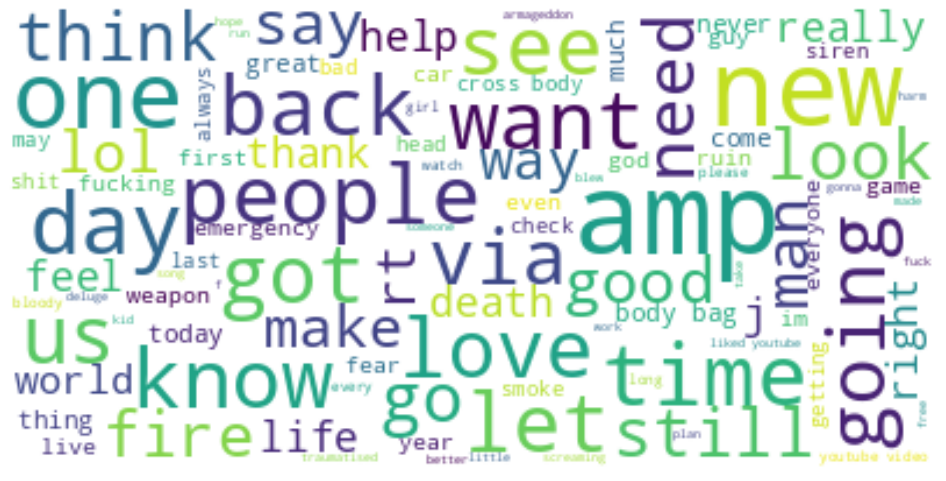

In [34]:
wordcloud = WordCloud(max_font_size=50, max_words=100, background_color="white").generate(text)
plt.figure(figsize=(15, 10), dpi=80)
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

# Extracting Features from Text
##### Using Bag of Words, TF-IDF Transformation

#### Use CountVectorizer to convert a collection of text documents to a "bag of words"

In [35]:
vectorizer = CountVectorizer()
bag_of_words = vectorizer.fit_transform(df['text'])

bag_of_words

<7613x21637 sparse matrix of type '<class 'numpy.int64'>'
	with 111497 stored elements in Compressed Sparse Row format>

In [36]:
print(bag_of_words)

  (0, 14003)	1
  (0, 5490)	1
  (0, 2192)	1
  (0, 18669)	1
  (0, 15678)	1
  (0, 13681)	1
  (0, 18777)	1
  (0, 6379)	1
  (0, 12141)	1
  (0, 1852)	1
  (0, 7661)	1
  (0, 19774)	1
  (0, 1851)	1
  (1, 7652)	1
  (1, 7439)	1
  (1, 13122)	1
  (1, 11091)	1
  (1, 16266)	1
  (1, 16611)	1
  (1, 3843)	1
  (2, 2192)	2
  (2, 1851)	1
  (2, 15940)	1
  (2, 2312)	1
  (2, 18971)	1
  :	:
  (7611, 11518)	1
  (7611, 16895)	1
  (7611, 1670)	1
  (7611, 9967)	1
  (7611, 18814)	1
  (7611, 13361)	1
  (7611, 3047)	2
  (7611, 4589)	1
  (7611, 14783)	1
  (7611, 18088)	1
  (7611, 9841)	1
  (7612, 18669)	1
  (7612, 3698)	1
  (7612, 3797)	1
  (7612, 9304)	1
  (7612, 4517)	1
  (7612, 13195)	1
  (7612, 12698)	1
  (7612, 11187)	1
  (7612, 13391)	1
  (7612, 1434)	1
  (7612, 20606)	1
  (7612, 9170)	1
  (7612, 15606)	1
  (7612, 21262)	1


#### Get the value to which a word is mapped

In [37]:
vectorizer.vocabulary_.get('disaster')

5841

In [38]:
#vectorizer.vocabulary_

In [39]:
#pd.DataFrame(bag_of_words.toarray(), columns=vectorizer.get_feature_names())

#### Extend bag of words with TF-IDF weights

In [40]:
vectorizer = TfidfVectorizer()
bag_of_words = vectorizer.fit_transform(df['text'])

print(bag_of_words)

  (0, 1851)	0.20827049400579561
  (0, 19774)	0.24477443310741195
  (0, 7661)	0.41872819867651895
  (0, 1852)	0.3616934826352278
  (0, 12141)	0.2592123351950127
  (0, 6379)	0.2904421828375658
  (0, 18777)	0.1800147670172314
  (0, 13681)	0.11990034967586292
  (0, 15678)	0.3265463550381381
  (0, 18669)	0.10169057350001784
  (0, 2192)	0.18937339953178942
  (0, 5490)	0.41872819867651895
  (0, 14003)	0.25309130456401624
  (1, 3843)	0.385143605810349
  (1, 16611)	0.48782712843724685
  (1, 16266)	0.48782712843724685
  (1, 11091)	0.35894718133854775
  (1, 13122)	0.31294120486788174
  (1, 7439)	0.2365324860692921
  (1, 7652)	0.30494408465089573
  (2, 7014)	0.21673027088707333
  (2, 13936)	0.22543202425089304
  (2, 13919)	0.14033250463283808
  (2, 6909)	0.18226487642545727
  (2, 13987)	0.1890144807081105
  :	:
  (7611, 9967)	0.23002920725460307
  (7611, 1670)	0.14089321956887677
  (7611, 16895)	0.234316081644427
  (7611, 11518)	0.19409754291276166
  (7611, 16086)	0.2615176214985051
  (7611, 11421

# Analysis #1 NLTK and BoW model and Text Classification

In [41]:
y = data['target']
X = data['text']

### Train Test Split

In [42]:

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=101)

### Tfidf Vectorization

In [43]:

tfidf = TfidfVectorizer(stop_words='english')

In [44]:
tfidf.fit(X_train)

TfidfVectorizer(stop_words='english')

In [45]:
X_train_tfidf = tfidf.transform(X_train)
X_test_tfidf = tfidf.transform(X_test)

In [46]:
X_train_tfidf

<6090x18650 sparse matrix of type '<class 'numpy.float64'>'
	with 55752 stored elements in Compressed Sparse Row format>

In [47]:
X_test_tfidf

<1523x18650 sparse matrix of type '<class 'numpy.float64'>'
	with 10830 stored elements in Compressed Sparse Row format>

In [48]:
#X_test

### Model training

In [49]:
nb = MultinomialNB()
nb.fit(X_train_tfidf,y_train)

MultinomialNB()

In [50]:
log = LogisticRegression(max_iter=500)
log.fit(X_train_tfidf,y_train)

LogisticRegression(max_iter=500)

In [51]:
svc = LinearSVC(penalty="l2")
svc.fit(X_train_tfidf,y_train)

LinearSVC()

### Evaluation

### Naive Bayes

In [52]:
preds = nb.predict(X_test_tfidf)
predicted_prob = nb.predict_proba(X_test_tfidf)
print(classification_report(y_test,preds))

              precision    recall  f1-score   support

           0       0.78      0.88      0.83       892
           1       0.80      0.65      0.71       631

    accuracy                           0.78      1523
   macro avg       0.79      0.76      0.77      1523
weighted avg       0.79      0.78      0.78      1523



In [53]:
confusion_matrix(y_test,preds)

array([[787, 105],
       [223, 408]])

In [54]:
classes = np.unique(y_test)

(array([0.5, 1.5]), [Text(0, 0.5, '0'), Text(0, 1.5, '1')])

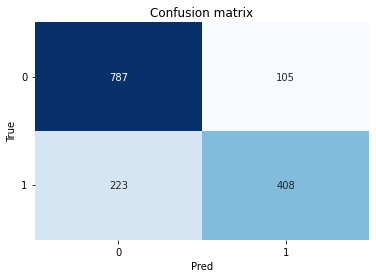

In [55]:
cm = confusion_matrix(y_test, preds)
fig, ax = plt.subplots()
sns.heatmap(cm, annot=True, fmt='d', ax=ax, cmap=plt.cm.Blues, 
            cbar=False)
ax.set(xlabel="Pred", ylabel="True", xticklabels=classes, 
       yticklabels=classes, title="Confusion matrix")
plt.yticks(rotation=0)

### Logistic Regression

In [56]:
preds = log.predict(X_test_tfidf)
print(classification_report(y_test,preds))
confusion_matrix(y_test,preds)


              precision    recall  f1-score   support

           0       0.79      0.88      0.83       892
           1       0.80      0.66      0.73       631

    accuracy                           0.79      1523
   macro avg       0.79      0.77      0.78      1523
weighted avg       0.79      0.79      0.79      1523



array([[787, 105],
       [212, 419]])

(array([0.5, 1.5]), [Text(0, 0.5, '0'), Text(0, 1.5, '1')])

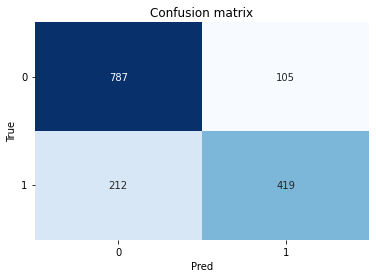

In [57]:
cm = confusion_matrix(y_test, preds)
fig, ax = plt.subplots()
sns.heatmap(cm, annot=True, fmt='d', ax=ax, cmap=plt.cm.Blues, 
            cbar=False)
ax.set(xlabel="Pred", ylabel="True", xticklabels=classes, 
       yticklabels=classes, title="Confusion matrix")
plt.yticks(rotation=0)

### Support Vector Machine

In [58]:
preds = svc.predict(X_test_tfidf)
print(classification_report(y_test,preds))
confusion_matrix(y_test,preds)

              precision    recall  f1-score   support

           0       0.80      0.83      0.82       892
           1       0.75      0.70      0.73       631

    accuracy                           0.78      1523
   macro avg       0.77      0.77      0.77      1523
weighted avg       0.78      0.78      0.78      1523



array([[744, 148],
       [188, 443]])

(array([0.5, 1.5]), [Text(0, 0.5, '0'), Text(0, 1.5, '1')])

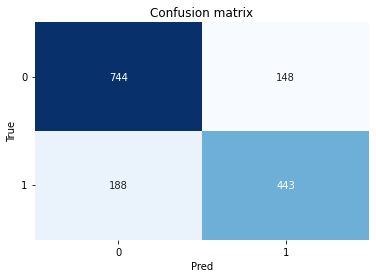

In [59]:
cm = confusion_matrix(y_test, preds)
fig, ax = plt.subplots()
sns.heatmap(cm, annot=True, fmt='d', ax=ax, cmap=plt.cm.Blues, 
            cbar=False)
ax.set(xlabel="Pred", ylabel="True", xticklabels=classes, 
       yticklabels=classes, title="Confusion matrix")
plt.yticks(rotation=0)

### Logistic Regression and Naive Bayes do have the same accuracy but differs slightly in the precision and recall

### Test data

In [60]:
dftest = pd.read_csv("/kaggle/input/nlp-getting-started/test.csv")
dftest.head()

,id,keyword,location,text
0,0,NaN,NaN,Just happened a terrible car crash
1,2,NaN,NaN,"Heard about #earthquake is different cities, s..."
2,3,NaN,NaN,"there is a forest fire at spot pond, geese are..."
3,9,NaN,NaN,Apocalypse lighting. #Spokane #wildfires
4,11,NaN,NaN,Typhoon Soudelor kills 28 in China and Taiwan


In [61]:
X = dftest[['text']]
X.head()

,text
0,Just happened a terrible car crash
1,"Heard about #earthquake is different cities, s..."
2,"there is a forest fire at spot pond, geese are..."
3,Apocalypse lighting. #Spokane #wildfires
4,Typhoon Soudelor kills 28 in China and Taiwan


### Applying the same transformation on the test data as on the train data

In [62]:
X = X.text.apply(cleanText)
X[150]

'You da One MTVSummerStar VideoVeranoMTV MTVHottest Britney Spears Lana Del Rey'

In [63]:
#converting to lower case
X = X.str.lower()

In [64]:
#removing punctuations
X=X.str.translate(str.maketrans('','',string.punctuation))

In [65]:
X = [removeStopWords(stopWords,x) for x in X]

In [66]:
X_test = tfidf.transform(X)

In [67]:
X_test

<3263x18650 sparse matrix of type '<class 'numpy.float64'>'
	with 23097 stored elements in Compressed Sparse Row format>

In [68]:
preds = nb.predict(X_test)


In [69]:
preds

array(['1', '1', '1', ..., '1', '1', '1'], dtype='<U1')

In [70]:
X_test.shape

(3263, 18650)

In [71]:
len(preds)

3263

In [72]:
len(dftest)

3263

In [73]:
df_submission = pd.DataFrame({'id': dftest.id, 'target' : preds} )
df_submission.head()
df_submission.to_csv('/kaggle/working/submission.csv', index=False) #0.79619


# Analysis #2 Understanding Spacy

In [74]:

nlp = spacy.load("en_core_web_sm")

doc = nlp(data["text"].values[1])
print(doc)

for entity in doc.ents:
    print(entity.text, entity.label_)

forest fire near la ronge sask canada
la ronge sask canada ORG


#### Entities

In [75]:
doc.ents

(la ronge sask canada,)

In [76]:
from tqdm.auto import tqdm
tqdm.pandas()

data["ents"] = data["text"].progress_map(lambda text: [(entity.text, entity.label_) for entity in nlp(text).ents])

  0%|          | 0/7613 [00:00<?, ?it/s]

In [77]:
data.sample(5)

,text,target,text_tokens,ents
6667,purple heart vet finds jihad threat car mall i...,0,"[purple, heart, vet, finds, jihad, threat, car...",[]
6362,ever think running choices life rembr kid choi...,0,"[ever, think, running, choices, life, rembr, k...",[]
5835,china stock market crash gems rubble china sto...,0,"[china, stock, market, crash, gems, rubble, ch...","[(china, GPE), (china, GPE), (summer, DATE)]"
1023,bags trunk body,0,"[bags, trunk, body]",[]
3383,school put evacuation alarms accidently differ...,0,"[school, put, evacuation, alarms, accidently, ...",[]


In [78]:
data["ent_types"] = data["ents"].progress_map(lambda x: set(ent[1] for ent in x))

  0%|          | 0/7613 [00:00<?, ?it/s]

In [79]:
def replace_text(text, entities):
    for ent_name, ent_type in entities:
        text = text.replace(ent_name, ent_type)
        
    return text

data["format_text"] = data.progress_apply(lambda x: replace_text(x["text"], x["ents"]), axis=1)

  0%|          | 0/7613 [00:00<?, ?it/s]

In [80]:
data.sample(5)

,text,target,text_tokens,ents,ent_types,format_text
7347,solitude fire update august solitude wildfire ...,1,"[solitude, fire, update, august, solitude, wil...","[(august, DATE)]",{DATE},solitude fire update DATE solitude wildfire su...
701,acousticmaloley blazing,0,"[acousticmaloley, blazing]","[(acousticmaloley blazing, PERSON)]",{PERSON},PERSON
936,blown away extension nothing seen many options...,0,"[blown, away, extension, nothing, seen, many, ...","[(one, CARDINAL)]",{CARDINAL},blown away extension nothing seen many options...
6189,rocket moon sleeping sirens rocket moon,0,"[rocket, moon, sleeping, sirens, rocket, moon]","[(rocket moon, PERSON), (sirens rocket moon, P...",{PERSON},PERSON sleeping sirens PERSON
7099,storm batters auckland northland violent overn...,1,"[storm, batters, auckland, northland, violent,...","[(auckland northland, PERSON), (auckland north...","{PERSON, GPE}",storm batters PERSON violent overnight storm b...


In [81]:
train_df, test_df = train_test_split(data, stratify=data["target"], test_size=0.1)

In [82]:
tfidf_vectorizer = TfidfVectorizer(max_df=0.99, 
                                min_df=5,
                                lowercase=True,
                                stop_words='english')
train_tfidf = tfidf_vectorizer.fit_transform(train_df["format_text"].values)

In [83]:
train_tfidf

<6851x1969 sparse matrix of type '<class 'numpy.float64'>'
	with 37876 stored elements in Compressed Sparse Row format>

In [84]:
model = LogisticRegression(multi_class="multinomial")
model.fit(train_tfidf, train_df["target"])

LogisticRegression(multi_class='multinomial')

In [85]:
test_tfidf = tfidf_vectorizer.transform(test_df["format_text"])
test_preds = model.predict(test_tfidf)
accuracy_score(test_df["target"], test_preds)

0.8097112860892388

In [86]:
from nltk.stem import PorterStemmer 
from nltk.tokenize import word_tokenize

ps = PorterStemmer() 
def stem_sentence(text):
    return " ".join([ps.stem(word) for word in word_tokenize(text)])

train_df["processed_text"] = train_df["format_text"].progress_map(stem_sentence)
test_df["processed_text"] = test_df["format_text"].map(stem_sentence)

  0%|          | 0/6851 [00:00<?, ?it/s]

In [87]:
tfidf_vectorizer = TfidfVectorizer(max_df=0.99, 
                                min_df=5,
                                lowercase=True,
                                stop_words='english')
train_tfidf = tfidf_vectorizer.fit_transform(train_df["processed_text"].values)

In [88]:
model = LogisticRegression(multi_class="multinomial")
model.fit(train_tfidf, train_df["target"])

test_tfidf = tfidf_vectorizer.transform(test_df["processed_text"])
test_preds = model.predict(test_tfidf)
accuracy_score(test_df["target"], test_preds)

0.8202099737532809

In [89]:
train_tfidf

<6851x1846 sparse matrix of type '<class 'numpy.float64'>'
	with 41507 stored elements in Compressed Sparse Row format>

# BoW model Ngrams

In [90]:
tfidf_vectorizer = TfidfVectorizer(max_df=0.99, 
                                   min_df=5,
                                   lowercase=True,
                                   stop_words='english',
                                   ngram_range=(1, 2) 
                                  )
train_tfidf = tfidf_vectorizer.fit_transform(train_df["processed_text"].values)

train_tfidf.shape

(6851, 2686)

In [91]:
model = LogisticRegression(solver='sag',multi_class="multinomial")
model.fit(train_tfidf, train_df["target"])



LogisticRegression(multi_class='multinomial', solver='sag')

In [92]:
test_tfidf = tfidf_vectorizer.transform(test_df["processed_text"])
test_preds = model.predict(test_tfidf)
accuracy_score(test_df["target"], test_preds)

0.8162729658792651

In [93]:
data['text length'] = data['text'].apply(len)

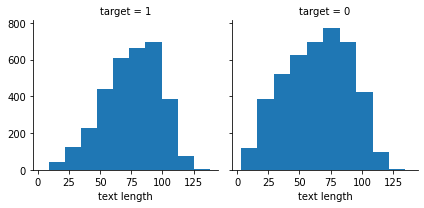

In [94]:
g = sns.FacetGrid(data,col='target')
g.map(plt.hist,'text length')

<AxesSubplot:xlabel='target', ylabel='text length'>

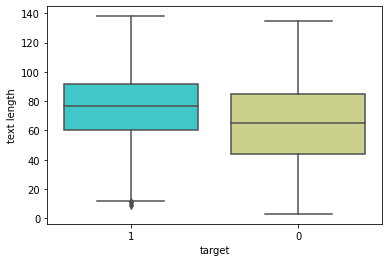

In [95]:
sns.boxplot(x='target',y='text length',data=data,palette='rainbow')

In [96]:
X=data['text']
y=data['target']

In [97]:

cv = CountVectorizer()

In [98]:
X = cv.fit_transform(X)

In [99]:
X_train, X_test, y_train, y_test = train_test_split(X, y,test_size=0.3,random_state=101)

In [100]:
nb = MultinomialNB()

In [101]:
nb.fit(X_train,y_train)

MultinomialNB()

In [102]:
predictions = nb.predict(X_test)

In [103]:
print(confusion_matrix(y_test,predictions))
print('\n')
print(classification_report(y_test,predictions))

[[1112  218]
 [ 260  694]]


              precision    recall  f1-score   support

           0       0.81      0.84      0.82      1330
           1       0.76      0.73      0.74       954

    accuracy                           0.79      2284
   macro avg       0.79      0.78      0.78      2284
weighted avg       0.79      0.79      0.79      2284



# Pipeline

In [104]:

pipeline = Pipeline([
    ('bow', CountVectorizer()),  # strings to token integer counts
    ('tfidf', TfidfTransformer()),  # integer counts to weighted TF-IDF scores
    ('classifier', MultinomialNB()),  # train on TF-IDF vectors w/ Naive Bayes classifier
])

In [105]:
X = data['text']
y = data['target']
X_train, X_test, y_train, y_test = train_test_split(X, y,test_size=0.3,random_state=101)

In [106]:
pipeline.fit(X_train,y_train)

Pipeline(steps=[('bow', CountVectorizer()), ('tfidf', TfidfTransformer()),
                ('classifier', MultinomialNB())])

In [107]:
predictions = pipeline.predict(X_test)

In [108]:
predicted_prob = pipeline.predict_proba(X_test)

In [109]:
predicted_prob

array([[0.88936984, 0.11063016],
       [0.0111053 , 0.9888947 ],
       [0.5878249 , 0.4121751 ],
       ...,
       [0.01561574, 0.98438426],
       [0.72169325, 0.27830675],
       [0.69545629, 0.30454371]])

In [110]:
print(confusion_matrix(y_test,predictions))
print(classification_report(y_test,predictions))

[[1187  143]
 [ 325  629]]
              precision    recall  f1-score   support

           0       0.79      0.89      0.84      1330
           1       0.81      0.66      0.73       954

    accuracy                           0.80      2284
   macro avg       0.80      0.78      0.78      2284
weighted avg       0.80      0.80      0.79      2284



(array([0.5, 1.5]), [Text(0, 0.5, '0'), Text(0, 1.5, '1')])

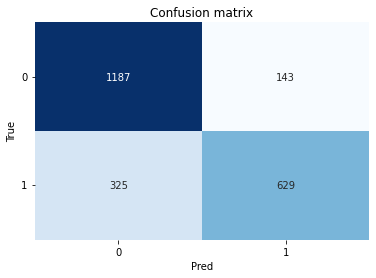

In [111]:
cm = confusion_matrix(y_test, predictions)
fig, ax = plt.subplots()
sns.heatmap(cm, annot=True, fmt='d', ax=ax, cmap=plt.cm.Blues, 
            cbar=False)
ax.set(xlabel="Pred", ylabel="True", xticklabels=classes, 
       yticklabels=classes, title="Confusion matrix")
plt.yticks(rotation=0)

# Interpreting text predictions with LIME

In [112]:
## select observation
idx = 0
txt_instance = X_test.iloc[idx]
## check true value and predicted value
print("True:", y_test.iloc[idx], "--> Pred:", predictions[idx], "| Prob:", round(np.max(predicted_prob[idx]),2))
## show explanation
explainer = lime_text.LimeTextExplainer(class_names=
             np.unique(y_train))
explained = explainer.explain_instance(txt_instance, pipeline.predict_proba, num_features=6)
explained.show_in_notebook(text=txt_instance, predict_proba=False)

True: 0 --> Pred: 0 | Prob: 0.89


In [113]:
## select observation
idx = 1
txt_instance = X_test.iloc[idx]
print(txt_instance)
## check true value and predicted value
print("True:", y_test.iloc[idx], "--> Pred:", predictions[idx], "| Prob:", round(np.max(predicted_prob[idx]),2))
## show explanation
explainer = lime_text.LimeTextExplainer(class_names=np.unique(y_train))
explained = explainer.explain_instance(txt_instance, pipeline.predict_proba, num_features=6)
explained.show_in_notebook(text=txt_instance, predict_proba=False)

pic yr old pkk suicide bomber detonated bomb turkey army trench released fvxhopdf
True: 1 --> Pred: 1 | Prob: 0.99


In [114]:
## select observation
idx = 2
txt_instance = X_test.iloc[idx]
print(txt_instance)
## check true value and predicted value
print("True:", y_test.iloc[idx], "--> Pred:", predictions[idx], "| Prob:", round(np.max(predicted_prob[idx]),2))
## show explanation
explainer = lime_text.LimeTextExplainer(class_names=np.unique(y_train))
explained = explainer.explain_instance(txt_instance, pipeline.predict_proba, num_features=6)
explained.show_in_notebook(text=txt_instance, predict_proba=False)

another mac vuln oxxrnab un
True: 0 --> Pred: 0 | Prob: 0.59


In [115]:
## select observation
idx = 3
txt_instance = X_test.iloc[idx]
print(txt_instance)
## check true value and predicted value
print("True:", y_test.iloc[idx], "--> Pred:", predictions[idx], "| Prob:", round(np.max(predicted_prob[idx]),2))
## show explanation
explainer = lime_text.LimeTextExplainer(class_names=np.unique(y_train))
explained = explainer.explain_instance(txt_instance, pipeline.predict_proba, num_features=6)
explained.show_in_notebook(text=txt_instance, predict_proba=False)

hurricane dolce prob
True: 1 --> Pred: 0 | Prob: 0.54


In [116]:
## select observation
idx = 4
txt_instance = X_test.iloc[idx]
print(txt_instance)
## check true value and predicted value
print("True:", y_test.iloc[idx], "--> Pred:", predictions[idx], "| Prob:", round(np.max(predicted_prob[idx]),2))
## show explanation
explainer = lime_text.LimeTextExplainer(class_names=np.unique(y_train))
explained = explainer.explain_instance(txt_instance, pipeline.predict_proba, num_features=6)
explained.show_in_notebook(text=txt_instance, predict_proba=False)

years atomic bombs japan still struggles war past anniversary devastation wrought targ igbz
True: 1 --> Pred: 1 | Prob: 0.97


In [117]:
X = dftest['text']

In [118]:
predictions = pipeline.predict(X)

In [119]:
df_submission = pd.DataFrame({'id': dftest.id, 'target' : predictions} )

In [120]:
df_submission.head()

,id,target
0,0,1
1,2,0
2,3,1
3,9,1
4,11,1


In [121]:
#df_submission.to_csv('/kaggle/working/submissionnew2.csv', index=False)  ## 0.79007 accuracy

# Analysis#3 Understanding Word Embeddings with Gensim 

#### Word2vec learns the meaning of words by processing a large corpus of unlabelled text. The word embeddings are the weights of the hidden layer that the neural network learns during the training process.The Word2vec model contains information about the relationships between words including similarity. The two ways of training word2vec embeddings are the skip gram approach that predicts the output words from a word of interest and continuous bag of words model predicts the target word from the nearby words.

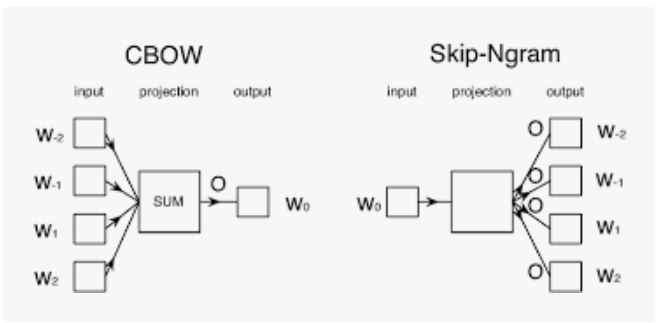

#### we can either use pre trained model or train word2vec from the text corpus

In [122]:
# take the text column
text = data['text'].values
text

array(['deeds reason earthquake may allah forgive us',
       'forest fire near la ronge sask canada',
       'residents asked shelter place notified officers evacuation shelter place orders expected',
       ..., 'utc km volcano hawaii zdtoyd ebj',
       'police investigating bike collided car little portugal bike rider suffered serious non life threatening injuries',
       'latest homes razed northern california wildfire abc news ymy rskq'],
      dtype=object)

In [123]:
# tokenize the words
new_vec = [nltk.word_tokenize(textdata) for textdata in text]
new_vec[0]

['deeds', 'reason', 'earthquake', 'may', 'allah', 'forgive', 'us']

In [124]:
# build the model
model = Word2Vec(new_vec, min_count=1,vector_size=32)
model

In [125]:
# predict the output
model.wv.most_similar('fire')
model.wv['fire']

array([ 0.04934723, -0.27401656,  0.13237515,  0.21608284,  0.06847183,
       -0.18604225,  0.0854969 ,  0.03131091, -0.16794972, -0.00138042,
        0.12500304, -0.10468395,  0.11465517, -0.14307116, -0.0873006 ,
       -0.05978556, -0.17326964,  0.10439557, -0.00248216,  0.25745624,
        0.15439034,  0.3021971 ,  0.21508244, -0.17909795, -0.02103731,
        0.13485833, -0.21599382,  0.05817065, -0.007018  , -0.19823168,
        0.05122579,  0.03400931], dtype=float32)

In [126]:
vec = model.wv['disaster']
model.wv.most_similar([vec]) #### fire, emergency similar to disaster

[('disaster', 1.0000001192092896),
 ('via', 0.915782630443573),
 ('us', 0.9153611660003662),
 ('fire', 0.907741129398346),
 ('one', 0.9070460796356201),
 ('police', 0.906389594078064),
 ('got', 0.9059203267097473),
 ('rt', 0.9036955833435059),
 ('would', 0.9035220146179199),
 ('amp', 0.9017359018325806)]

In [127]:
vec = model.wv['police']
model.wv.most_similar([vec]) #### people, fire similar to police

[('police', 1.0000001192092896),
 ('news', 0.9776194095611572),
 ('day', 0.9776092767715454),
 ('like', 0.9741173386573792),
 ('fire', 0.9724134206771851),
 ('people', 0.9711213111877441),
 ('amp', 0.9692071676254272),
 ('new', 0.966856062412262),
 ('world', 0.9636996984481812),
 ('one', 0.9605333805084229)]

In [128]:
vec = model.wv['emergency']
model.wv.most_similar([vec]) #### crash, fire similar to emergency

[('emergency', 1.0),
 ('like', 0.9754951596260071),
 ('people', 0.9745470285415649),
 ('amp', 0.9701777100563049),
 ('one', 0.9699090719223022),
 ('man', 0.9690790176391602),
 ('fire', 0.968621551990509),
 ('get', 0.9676693081855774),
 ('news', 0.9658746719360352),
 ('crash', 0.9564820528030396)]

# Analysis#4

# Topic modelling with Latent Dirichlet Allocation

#### Documents are probability distributions over topics and topics themselves are the probability distribution over words

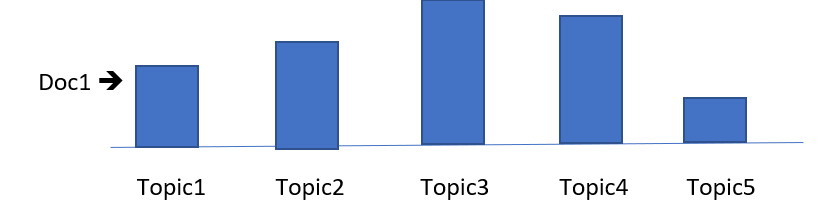

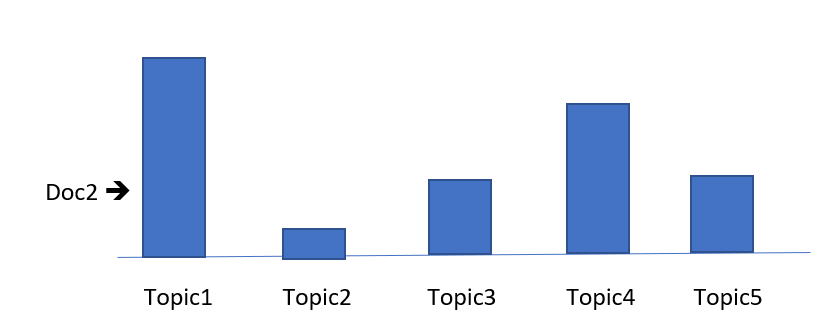

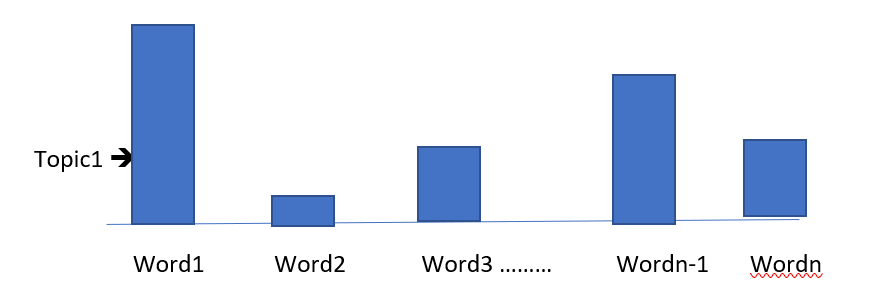

#### disaster tweets and non disaster tweets

In [129]:
disaster_tweets_df = data[data['target']=="1"]['text']
nondisaster_tweets_df = data[data['target']=="0"]['text']

In [130]:
LDA = LatentDirichletAllocation(n_components=4,random_state=42) # 4 topics

In [131]:
vectorizer = TfidfVectorizer()
dtm = vectorizer.fit_transform(disaster_tweets_df)
dtm

<3271x11780 sparse matrix of type '<class 'numpy.float64'>'
	with 34362 stored elements in Compressed Sparse Row format>

In [132]:
LDA.fit(dtm)

LatentDirichletAllocation(n_components=4, random_state=42)

In [133]:
len(vectorizer.get_feature_names())

11780

#### lets check random 10 stored words

In [134]:


for i in range(10):
    random_id = random.randint(0,len(vectorizer.get_feature_names()))
    print(vectorizer.get_feature_names()[random_id])

tb
indie
aussie
eyecuts
iot
buted
coldmpress
sized
guevara
aunt


In [135]:
for i in range(10):
    random_id = random.randint(0,len(vectorizer.get_feature_names()))
    print(vectorizer.get_feature_names()[random_id])

dvu
startelegram
izqdk
plains
snake
nslzl
wcofmlub
kftvnu
minion
lozlsu


#### Words per topic

In [136]:
LDA.components_

array([[0.26163974, 0.2501629 , 0.25012052, ..., 0.25027483, 0.25011024,
        0.53231093],
       [0.5589954 , 0.74405848, 0.25014025, ..., 0.25013802, 0.25011214,
        0.25036223],
       [1.21500659, 0.25019163, 0.25011216, ..., 0.59543035, 0.55746351,
        0.304307  ],
       [0.25030236, 0.25017633, 0.63040726, ..., 0.25027178, 0.2501174 ,
        0.25029861]])

In [137]:
len(LDA.components_[0])

11780

In [138]:
single_topic = LDA.components_[0]

In [139]:
# Returns the indices that would sort this array.
single_topic.argsort()

array([7629, 3123, 3161, ..., 7458, 1103, 9555])

In [140]:
top_word_indices = single_topic.argsort()[-10:]

#### The first topic contains the probabilities of words for topic 1. 
#### To sort the indexes according to probability values, we use the argsort() function. 
#### Once sorted, the 10 words with the highest probabilities will now belong to the last 10 indexes of the array.

In [141]:
for index in top_word_indices:
    print(vectorizer.get_feature_names()[index]) # we can find words like bomber, suicide, oil, spill, fire, sandstorm

fire
minute
oil
watch
get
spill
sandstorm
people
bomber
suicide


In [142]:
for i,topic in enumerate(LDA.components_):
    print(f'Top 15 words for topic #{i}:')
    print([vectorizer.get_feature_names()[i] for i in topic.argsort()[-15:]])
    print('\n')

Top 15 words for topic #0:
['like', 'airport', 'swallowed', 'bomb', 'may', 'fire', 'minute', 'oil', 'watch', 'get', 'spill', 'sandstorm', 'people', 'bomber', 'suicide']


Top 15 words for topic #1:
['families', 'attacked', 'forest', 'investigators', 'sinkhole', 'amp', 'injured', 'malaysia', 'attack', 'conclusively', 'mh', 'wreckage', 'confirmed', 'pm', 'fire']


Top 15 words for topic #2:
['fire', 'news', 'wildfire', 'anniversary', 'years', 'homes', 'california', 'northern', 'japan', 'bombing', 'atomic', 'obama', 'typhoon', 'disaster', 'hiroshima']


Top 15 words for topic #3:
['killed', 'missing', 'found', 'derailment', 'reunion', 'news', 'fires', 'affected', 'suspect', 'accident', 'outbreak', 'train', 'debris', 'families', 'legionnaires']




#### non disaster tweets 

In [143]:
dtm = vectorizer.fit_transform(nondisaster_tweets_df)
dtm

<4342x14462 sparse matrix of type '<class 'numpy.float64'>'
	with 40214 stored elements in Compressed Sparse Row format>

In [144]:
LDA.fit(dtm) # 4 topics

LatentDirichletAllocation(n_components=4, random_state=42)

In [145]:
len(vectorizer.get_feature_names())

14462

In [146]:
for i in range(10):
    random_id = random.randint(0,len(vectorizer.get_feature_names()))
    print(vectorizer.get_feature_names()[random_id])


hypocrisy
monitoring
kyrikoni
coach
freezing
rea
caves
fighters
switching
marvel


In [147]:
for i in range(10):
    random_id = random.randint(0,len(vectorizer.get_feature_names()))
    print(vectorizer.get_feature_names()[random_id])


magnum
rant
fpoj
super
leftwich
fettilootch
mre
jxhazebnqk
headphones
wealilknowa


#### words per topic

In [148]:
LDA.components_

array([[0.53338372, 0.25012646, 0.25020699, ..., 0.25014297, 0.25014549,
        0.25020609],
       [0.25024983, 0.25013403, 0.25015376, ..., 0.25014362, 0.25014674,
        0.25018825],
       [0.25026346, 0.2501446 , 0.56407541, ..., 0.55797157, 0.25015108,
        0.25019805],
       [0.51953338, 0.59447631, 0.2501464 , ..., 0.25013566, 0.60558718,
        0.63414512]])

In [149]:
len(LDA.components_[0])

14462

In [150]:
single_topic = LDA.components_[0]

In [151]:
# Returns the indices that would sort this array.
single_topic.argsort()

array([ 8735,  2544,  2653, ..., 13907,  2810,  7149])

In [152]:
# Top 10 words for this topic:
single_topic.argsort()[-10:]

array([11855,   372,  2589,  4837,  1231, 12449, 13878, 13907,  2810,
        7149])

In [153]:
top_word_indices = single_topic.argsort()[-10:]

In [154]:
for index in top_word_indices:
    print(vectorizer.get_feature_names()[index])

stock
amp
crush
get
blood
think
would
wrecked
day
like


In [155]:
for i,topic in enumerate(LDA.components_):
    print(f'Top 15 words for topic #{i}:')
    print([vectorizer.get_feature_names()[i] for i in topic.argsort()[-15:]])
    print('\n')

Top 15 words for topic #0:
['love', 'drown', 'fire', 'man', 'know', 'stock', 'amp', 'crush', 'get', 'blood', 'think', 'would', 'wrecked', 'day', 'like']


Top 15 words for topic #1:
['via', 'going', 'sound', 'bag', 'come', 'amp', 'screaming', 'best', 'body', 'fatality', 'wreck', 'content', 'like', 'reddit', 'new']


Top 15 words for topic #2:
['cliff', 'world', 'fall', 'pandemonium', 'fear', 'ass', 'time', 'panic', 'amp', 'get', 'bang', 'one', 'loud', 'like', 'love']


Top 15 words for topic #3:
['people', 'new', 'still', 'youtube', 'back', 'ruin', 'life', 'one', 'video', 'got', 'see', 'amp', 'body', 'get', 'like']




#### LDA with gensim
#### The Dictionary and Corpus needed for Topic Modeling
#### The two main inputs to the LDA topic model are the dictionary(id2word) and the corpus.

In [156]:
disaster_tweets_df = data[data['target']=="1"]['text_tokens']

In [157]:
# Create Dictionary
id2word = corpora.Dictionary(disaster_tweets_df.values)

In [158]:
# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in disaster_tweets_df]

# View
print(corpus[:1])

[[(0, 1), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1), (6, 1)]]


In [159]:
id2word[0]

'allah'

In [160]:
[[(id2word[id], freq) for id, freq in cp] for cp in corpus[:1]]

[[('allah', 1),
  ('deeds', 1),
  ('earthquake', 1),
  ('forgive', 1),
  ('may', 1),
  ('reason', 1),
  ('us', 1)]]

#### alpha and eta are hyperparameters that affect sparsity of the topics.


#### chunksize is the number of documents to be used in each training chunk. 
#### update_every determines how often the model parameters should be updated and passes is the total number of training passes.

In [161]:
lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=4, 
                                           random_state=100,
                                           update_every=1,
                                           chunksize=100,
                                           passes=10,
                                           alpha='auto',
                                           per_word_topics=True)

#### The above LDA model is built with 4 different topics where each topic is a combination of keywords and each keyword contributes a certain weightage to the topic.

In [162]:
# Print the Keyword in the 10 topics
pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]

[(0,
  '0.014*"police" + 0.012*"storm" + 0.010*"officer" + 0.008*"severe" + '
  '0.008*"violent" + 0.008*"thunderstorm" + 0.007*"volcano" + 0.007*"people" + '
  '0.007*"like" + 0.006*"water"'),
 (1,
  '0.022*"mh" + 0.022*"wreckage" + 0.022*"pm" + 0.017*"confirmed" + '
  '0.017*"malaysia" + 0.015*"families" + 0.014*"conclusively" + '
  '0.013*"investigators" + 0.011*"wildfire" + 0.011*"wounded"'),
 (2,
  '0.014*"disaster" + 0.013*"typhoon" + 0.010*"obama" + 0.010*"video" + '
  '0.009*"old" + 0.007*"weapons" + 0.006*"terrorism" + 0.006*"war" + '
  '0.006*"island" + 0.005*"state"'),
 (3,
  '0.018*"suicide" + 0.013*"california" + 0.013*"news" + 0.011*"fires" + '
  '0.010*"bomber" + 0.010*"killed" + 0.010*"wild" + 0.008*"bomb" + 0.008*"amp" '
  '+ 0.007*"nuclear"')]


#### Model perplexity and topic coherence provide a convenient measure to judge how good a given topic model is

#### Topic1 and Topic4 related to nature related catastrophe for example weather, tornado, volcano, thunderstorm, storm, weather, wiildfire.
#### Topic2 army, crash, bombing, survivors
#### Topic3 migrants, trauma, earthquake, shots

In [163]:
# Visualize the topics
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(lda_model, corpus, id2word)
vis

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
0     -0.005764  0.170418       1        1  27.417221
3     -0.168736 -0.146040       2        1  26.461210
1      0.213341 -0.097576       3        1  24.190961
2     -0.038841  0.073198       4        1  21.930608, topic_info=           Term        Freq       Total Category  logprob  loglift
3520         mh  193.000000  193.000000  Default  30.0000  30.0000
233          pm  187.000000  187.000000  Default  29.0000  29.0000
7902   wreckage  190.000000  190.000000  Default  28.0000  28.0000
1025    suicide  169.000000  169.000000  Default  27.0000  27.0000
2766  confirmed  149.000000  149.000000  Default  26.0000  26.0000
...         ...         ...         ...      ...      ...      ...
49        flood   22.500898   23.117457   Topic4  -5.8458   1.4903
1557     inside   23.210651   23.928312   Topic4  -5.8147   1.4868
5599    tsunami   25.928449   27.392073   Topic4  -5.7040   1.4624
3004      spill   28.638983   32.367532   Topic4  -5.6046   1.3949
877    northern   38.581740   75.284845   Topic4  -5.3065   0.8488

[176 rows x 6 columns], token_table=      Topic      Freq      Term
term                           
1520      4  0.980318       abc
426       2  0.980827   airport
497       2  0.994424       amp
648       2  0.978533      army
706       2  0.995737    attack
...     ...       ...       ...
7902      2  0.005236  wreckage
7902      3  0.989559  wreckage
7902      4  0.005236  wreckage
1816      1  0.990734      year
1875      2  0.979657        yr

[177 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 4, 2, 3])

#### non disaster tweets

In [164]:

nondisaster_tweets_df = data[data['target']=="0"]['text_tokens']

In [165]:
# Create Dictionary
id2word = corpora.Dictionary(nondisaster_tweets_df.values)


In [166]:
# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in nondisaster_tweets_df]

# View
print(corpus[:1])

[[(0, 1)]]


In [167]:
id2word[0]

'man'

In [168]:
[[(id2word[id], freq) for id, freq in cp] for cp in corpus[:1]]

[[('man', 1)]]

In [169]:
lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=4, 
                                           random_state=100,
                                           update_every=1,
                                           chunksize=100,
                                           passes=10,
                                           alpha='auto',
                                           per_word_topics=True)

In [170]:
# Print the Keyword in the 10 topics
pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]

[(0,
  '0.030*"wrecked" + 0.012*"amp" + 0.008*"words" + 0.007*"day" + '
  '0.007*"disney" + 0.007*"lol" + 0.007*"got" + 0.007*"love" + 0.006*"would" + '
  '0.006*"world"'),
 (1,
  '0.024*"like" + 0.017*"wreck" + 0.011*"one" + 0.010*"get" + 0.009*"still" + '
  '0.007*"good" + 0.006*"zone" + 0.005*"im" + 0.005*"movie" + 0.005*"school"'),
 (2,
  '0.008*"time" + 0.007*"see" + 0.007*"youtube" + 0.007*"video" + '
  '0.006*"people" + 0.006*"go" + 0.006*"rt" + 0.005*"life" + 0.005*"going" + '
  '0.005*"help"'),
 (3,
  '0.015*"new" + 0.011*"stock" + 0.008*"back" + 0.007*"trouble" + 0.007*"much" '
  '+ 0.007*"via" + 0.007*"weapons" + 0.007*"great" + 0.007*"news" + '
  '0.006*"war"')]


#### Topic1 words like survive,disney,love,pretty
#### Topic2 words like youtube, videos, amazon, work
#### Topic3 words like good, movie, school, emotional
#### Topic4 words like stock, new, great, god

In [171]:
# Visualize the topics
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(lda_model, corpus, id2word)
vis

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
0      0.165869  0.001632       1        1  27.492148
2     -0.058368 -0.120321       2        1  25.971180
1     -0.060838  0.123815       3        1  24.002524
3     -0.046663 -0.005126       4        1  22.534148, topic_info=           Term        Freq       Total Category  logprob  loglift
23         like  239.000000  239.000000  Default  30.0000  30.0000
14400   wrecked  391.000000  391.000000  Default  29.0000  29.0000
51          new  138.000000  138.000000  Default  28.0000  28.0000
487       wreck  193.000000  193.000000  Default  27.0000  27.0000
180         amp  139.000000  139.000000  Default  26.0000  26.0000
...         ...         ...         ...      ...      ...      ...
6715    trouble   65.600314   72.249362   Topic4  -4.9555   1.3936
9223   survived   44.635966   48.093159   Topic4  -5.3406   1.4155
11058   ancient   27.111940   28.798159   Topic4  -5.8391   1.4298
2869    wounded   38.438290   45.524769   Topic4  -5.4901   1.3209
10583      loud   27.551164   30.118099   Topic4  -5.8231   1.4011

[176 rows x 6 columns], token_table=       Topic      Freq     Term
term                           
319        3  0.983501     also
2721       2  0.979808   amazon
180        1  0.995490      amp
11058      1  0.034724  ancient
11058      2  0.034724  ancient
...      ...       ...      ...
393        2  0.993734  youtube
847        1  0.016886     zone
847        2  0.016886     zone
847        3  0.962506     zone
847        4  0.016886     zone

[206 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 3, 2, 4])

#### how non-negative matrix factorization can be used for topic modeling.

#### Non-negative matrix factorization is also a supervised learning technique which performs clustering as well as dimensionality reduction. It can be used in combination with TF-IDF scheme to perform topic modeling.

#### disaster tweets

In [172]:
disaster_tweets_df = data[data['target']=="1"]['text']

In [173]:
vectorizer = TfidfVectorizer()
dtm = vectorizer.fit_transform(disaster_tweets_df)
dtm

<3271x11780 sparse matrix of type '<class 'numpy.float64'>'
	with 34362 stored elements in Compressed Sparse Row format>

In [174]:


nmf = NMF(n_components=4, random_state=42)
nmf.fit(dtm )

NMF(n_components=4, random_state=42)

In [175]:
for i in range(10):
    random_id = random.randint(0,len(vectorizer.get_feature_names()))
    print(vectorizer.get_feature_names()[random_id])

cbb
volgagrad
vjxa
xxfk
codycarnes
charts
kakeru
arizzo
worsen
honest


In [176]:
first_topic = nmf.components_[0]
top_topic_words = first_topic.argsort()[-10:]

In [177]:
for i in top_topic_words:
    print(vectorizer.get_feature_names()[i])

reunion
families
debris
investigators
conclusively
pm
wreckage
confirmed
malaysia
mh


In [178]:
for i,topic in enumerate(nmf.components_):
    print(f'Top 15 words for topic #{i}:')
    print([vectorizer.get_feature_names()[i] for i in topic.argsort()[-15:]])
    print('\n')

Top 15 words for topic #0:
['flight', 'aircraft', 'island', 'missing', 'found', 'reunion', 'families', 'debris', 'investigators', 'conclusively', 'pm', 'wreckage', 'confirmed', 'malaysia', 'mh']


Top 15 words for topic #1:
['marians', 'razed', 'latest', 'wildfire', 'homes', 'california', 'declaration', 'signs', 'devastated', 'saipan', 'declares', 'typhoon', 'northern', 'disaster', 'obama']


Top 15 words for topic #2:
['bestnaijamade', 'mosque', 'saudi', 'pic', 'released', 'army', 'trench', 'turkey', 'yr', 'pkk', 'detonated', 'bomb', 'old', 'bomber', 'suicide']


Top 15 words for topic #3:
['elqlopfk', 'manslaughter', 'news', 'boy', 'charged', 'year', 'edinburgh', 'disease', 'disea', 'fatal', 'affected', 'sue', 'outbreak', 'families', 'legionnaires']




#### non disaster tweets

In [179]:
nondisaster_tweets_df = data[data['target']=="0"]['text']

In [180]:
vectorizer = TfidfVectorizer()
dtm = vectorizer.fit_transform(nondisaster_tweets_df)
dtm

<4342x14462 sparse matrix of type '<class 'numpy.float64'>'
	with 40214 stored elements in Compressed Sparse Row format>

In [181]:
nmf = NMF(n_components=4, random_state=42)
nmf.fit(dtm )

NMF(n_components=4, random_state=42)

In [182]:
for i in range(10):
    random_id = random.randint(0,len(vectorizer.get_feature_names()))
    print(vectorizer.get_feature_names()[random_id])

sequalae
emo
unfml
texans
moll
qnq
trials
pattyds
chambers
wackoes


In [183]:
first_topic = nmf.components_[0]
top_topic_words = first_topic.argsort()[-10:]

In [184]:
for i in top_topic_words:
    print(vectorizer.get_feature_names()[i])

got
people
feel
back
love
would
one
amp
get
like


In [185]:
for i,topic in enumerate(nmf.components_):
    print(f'Top 15 words for topic #{i}:')
    print([vectorizer.get_feature_names()[i] for i in topic.argsort()[-15:]])
    print('\n')

Top 15 words for topic #0:
['want', 'think', 'time', 'know', 'see', 'got', 'people', 'feel', 'back', 'love', 'would', 'one', 'amp', 'get', 'like']


Top 15 words for topic #1:
['prebreak', 'best', 'many', 'goes', 'effect', 'subreddits', 'banned', 'horrible', 'new', 'quarantined', 'policy', 'offensive', 'quarantine', 'content', 'reddit']


Top 15 words for topic #2:
['ercjmnea', 'shawie', 'matako', 'news', 'breaking', 'wind', 'appears', 'nearby', 'unconfirmed', 'neighbour', 'ass', 'blast', 'heard', 'bang', 'loud']


Top 15 words for topic #3:
['full', 'purse', 'ladies', 'bagging', 'faux', 'tote', 'handbag', 'womens', 'new', 'leather', 'shoulder', 'bags', 'bag', 'cross', 'body']




# Analysis#5